**<h1> Pillow Library (PIL)</h1>**


Estimated time needed: **60** minutes


<h2>Objectives</h2>


Image processing and computer vision tasks include displaying, cropping, flipping, rotating,  image segmentation, classification, image restoration,  image recognition, image generation.  Also, working with images via the cloud requires storing, transmitting, and gathering images through the internet. 

Python is an excellent choice as it has many image processing tools, computer vision and artificial intelligence libraries. Finally, it has many libraries for working with files in the cloud and on the internet.

A digital image is simply a file in your computer. In this lab, you will gain an understanding of these files and learn to work with these files with the Pillow Library (PIL).


<ul>
    <li><a href='#PIL'>Python Image Libraries </a>
        <ul>
            <li>Image Files and Paths  </li>
            <li>Load in Image in Python</li>
            <li>Plotting an Image </li>
            <li>Gray Scale Images, Quantization and Color Channels  </li>
            <li> PIL Images into NumPy Arrays  </li>
        </ul>
    </li>
    
</ul>


----


Download the images for the lab:


In [156]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/barbara.png -O barbara.png  

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


First, let's define a helper function to concatenate two images side-by-side. You will not need to understand the code below at this moment, but this function will be used repeatedly in this tutorial to showcase the results.


In [ ]:
def get_concat_h(im1, im2):  # Tạo một hàm tiện ích để ghép hai hình ảnh cạnh nhau theo chiều ngang. Tạo một ảnh RGB mới với chiều rộng kết hợp, sau đó dán cả hai ảnh vào các vị trí cụ thể.
    #https://note.nkmk.me/en/python-pillow-concat-images/
    dst = Image.new('RGB', (im1.width + im2.width, im1.height)) 
    dst.paste(im1, (0, 0)) 
    dst.paste(im2, (im1.width, 0))
    return dst

## Image Files and Paths  


An image is stored as a file on your computer. Below, we define `my_image` as the filename of a file in this directory.


In [ ]:
my_image = "lenna.png" # Gán biến my_image = Tên ảnh (lenna.png)

A filename consists of two parts: the name of the file and the extension, separated by a full stop (`.`). The extension specifies the format of the Image. There are two popular image formats: Joint Photographic Expert Group image (or `.jpg`, `.jpeg`) and Portable Network Graphics (or `.png`). These file types make it simpler to work with images. For example, it compresses the image, taking less spaces on your drive to store the image.


Image files are stored in the file system of your computer. The location of it is specified using a "path", which is often unique. You can find the path of your current working directory with Python's `os` module. The `os` module provides functions to interact with the file system, e.g. creating or removing a directory (folder), listing its contents, changing and identifying the current working directory. 


In [ ]:
import os # Import thư viện os
cwd = os.getcwd() # Lấy đường dẫn thư mục
cwd # Hiển thị đường dẫn thư mục

'c:\\Computer Vision'

The "path" to an image can be found using the following line of code.


In [ ]:
image_path = os.path.join(cwd, my_image) # Tạo đường dẫn đầy đủ đến ảnh bằng cách nối cwd và my_image
image_path # Hiển thị đường dẫn đến ảnh

'c:\\Computer Vision\\lenna.png'

## Load Images in Python


Pillow (PIL) library is a popular library for loading images in Python. In addition, many other libraries such as "Keras" and "PyTorch" use this library to work with images. The `Image` module provides functions to load images from and saving images to the file system. Let's import it from `PIL`.


In [ ]:
from PIL import Image # Import thư viện PIL để xử lý ảnh

If the image is in the current working directory, you can load the image as follows using the image's filename and create a PIL Image object:


In [ ]:
image = Image.open(my_image) # Mở ảnh từ đường dẫn my_image và gán vào biến image
type(image) # Kiểu dữ liệu của biến image

PIL.PngImagePlugin.PngImageFile

If you are working in a Jupyter environment, you can view the image by calling the variable itself.  


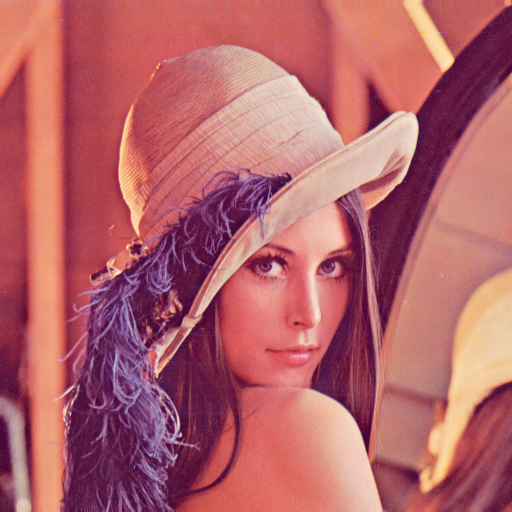

In [ ]:
image # Hiển thị ảnh

##  Plotting an Image 


We can also use the method `show` of PIL objects to display the image. Please note this method may or may not work depending on your setup.


In [ ]:
image.show() # Hiển thị ảnh trên ứng dụng xem ảnh mặc định của thiết bị đang sử dụng

You can also use <code>imshow</code> method from the <code>matplotlib</code> library to display the image.


In [ ]:
import matplotlib.pyplot as plt # Import thư viện matplotlib để hiển thị ảnh trong Jupyter notebook

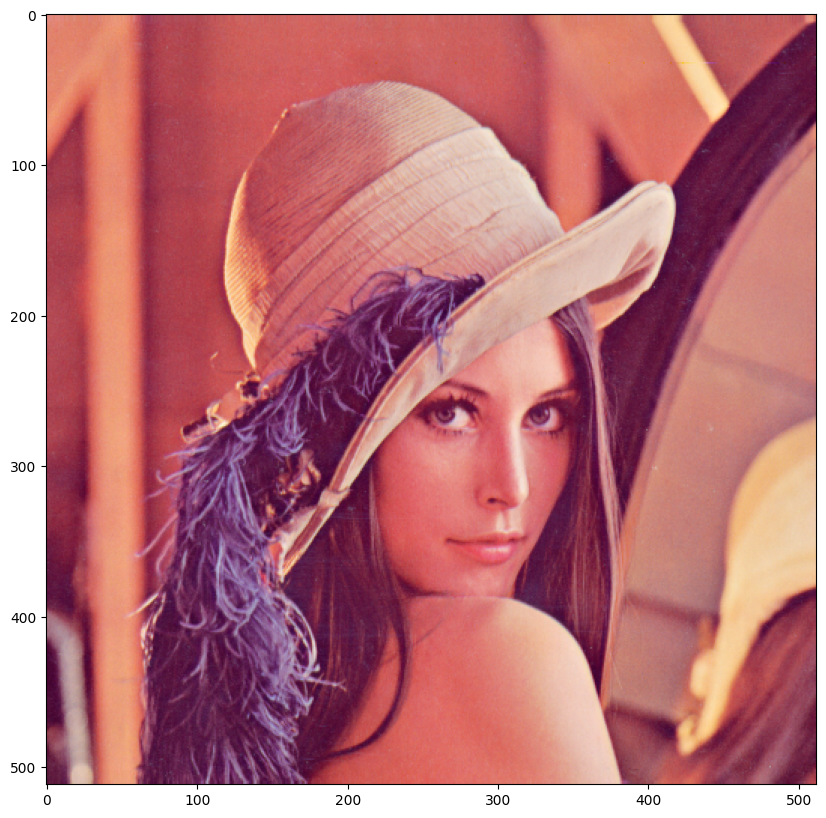

In [ ]:
plt.figure(figsize=(10,10)) # Thiết lập kích thước hiển thị ảnh theo cú pháp plt từ thư viện matplotlib
plt.imshow(image) # Hiển thị ảnh theo cú pháp plt từ thư viện matplotlib
plt.show() # In ra ảnh theo cú pháp plt từ thư viện matplotlib

You can also load the image using its full path. This comes in handy if the image is not in your working directory.


In [ ]:
image = Image.open(image_path) # Lấy ảnh từ đường dẫn image_path và gán vào biến image

We can use the attributes of the image object to get information. The attribute format is the extension or format of the image.


The attribute `size` returns a tuple, the first element is the number of pixels that comprise the width and the second element is the number of pixels that make up the height of the image.   


In [ ]:
print(image.size) # In ra kích thước ảnh (width, height)

(512, 512)


This is a string specifying the pixel format used. In this case, it's “RGB”. RGB is a color space where red, green, and blue are added together to produce other colors.



In [ ]:
print(image.mode) # In ảnh ở chế độ màu RGB

RGB


The `Image.open` method does not load image data into the computer memory. The `load` method of `PIL` object reads the file content, decodes it, and expands the image into memory.


In [ ]:
im = image.load() # Tải dữ liệu ảnh vào biến im để truy cập các pixel của ảnh

We can then check the intensity of the image at the $x$-th column and $y$-th row:


In [ ]:
x = 0 # Tọa độ x của pixel
y = 1  # Tọa độ y của pixel
im[y,x] # Giá trị RGB của pixel tại tọa độ (x,y)

(226, 137, 125)

We will use the array form to access the elements; it is slightly different.


You can save the image in `jpg` format using the following command.


In [ ]:
image.save("lenna.jpg") # Lưu ảnh mới dưới định dạng JPG với tên lenna.jpg

## Grayscale Images, Quantization and Color Channels  


### Grayscale Images


The `ImageOps` module contains several ‘ready-made’ image processing operations. This module is somewhat experimental, and most operators only work with grayscale and/or RGB images.


In [ ]:
from PIL import ImageOps # Import thư viện ImageOps từ PIL để xử lý ảnh

Grayscale images have pixel values representing the amount of light or intensity of that pixel. Light shades of gray have a high-intensity while darker shades have a lower intensity, i.e, white has the highest intensity and black the lowest.


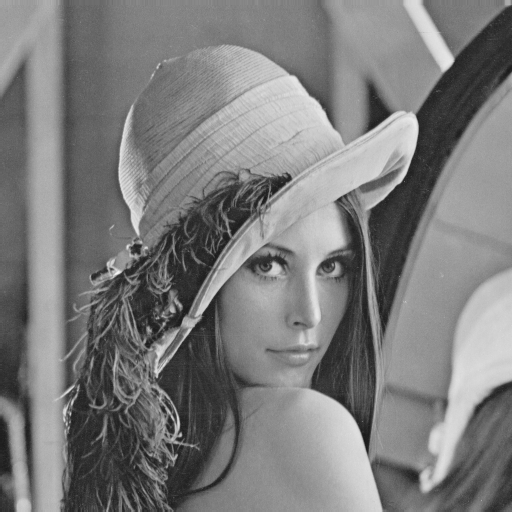

In [ ]:
image_gray = ImageOps.grayscale(image) # Chuyển đổi ảnh sang thang độ xám
image_gray # In ảnh thang độ xám 

The mode is `L` for grayscale.


In [ ]:
image_gray.mode # In ảnh thang độ xám ở chế độ L

'L'

### Quantization


The Quantization of an image is the number of unique intensity values any given pixel of the image can take. For a grayscale image, this means the number of different shades of gray. Most images have 256 different levels. You can decrease the levels using the method `quantize`. Let's repeatably cut the number of levels in half and observe what happens:


Half the levels do not make a noticable difference.


In [ ]:
image_gray.quantize(256 // 2) # Giảm số mức xám của ảnh thang độ xám xuống còn 128 mức
image_gray.show() # Hiển thị ảnh thang độ xám với 128 mức xám

Let’s continue dividing the number of values by two and compare it to the original image.


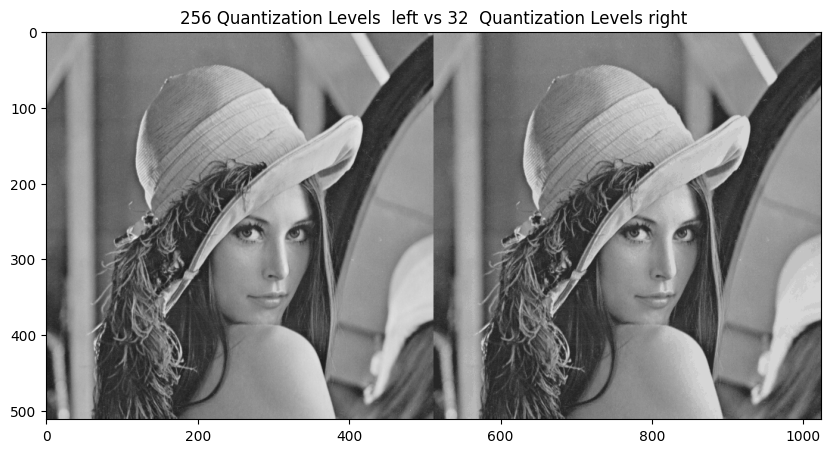

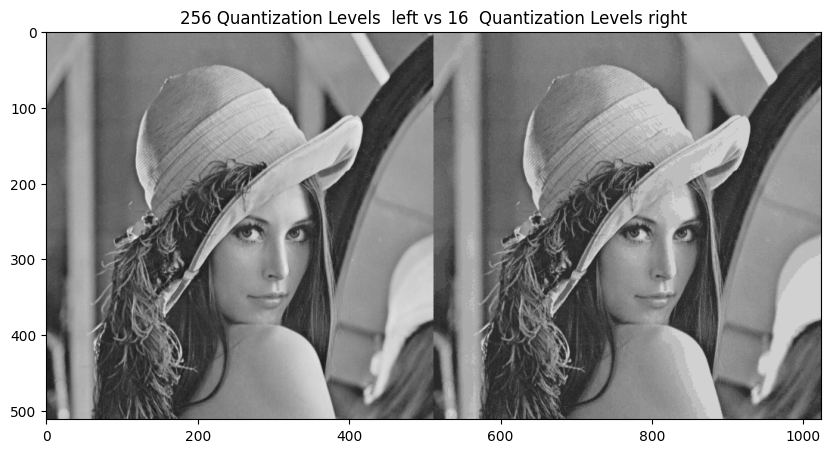

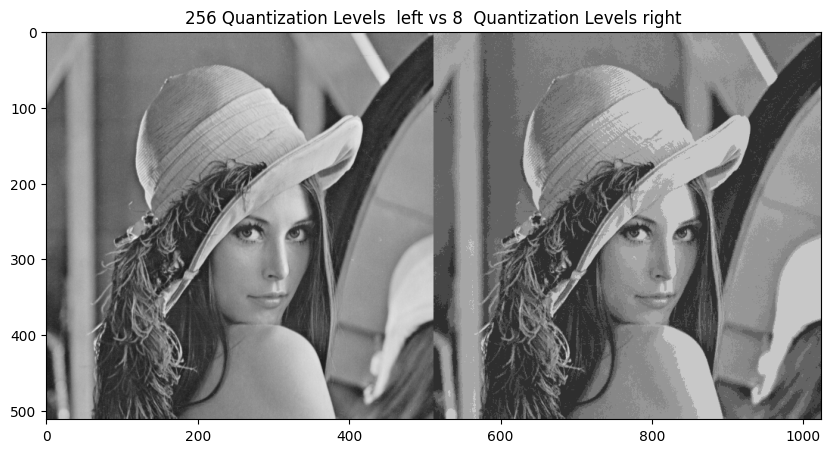

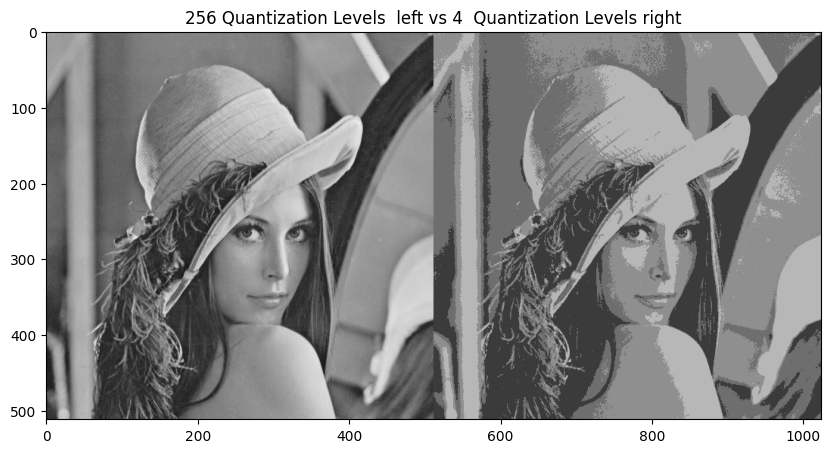

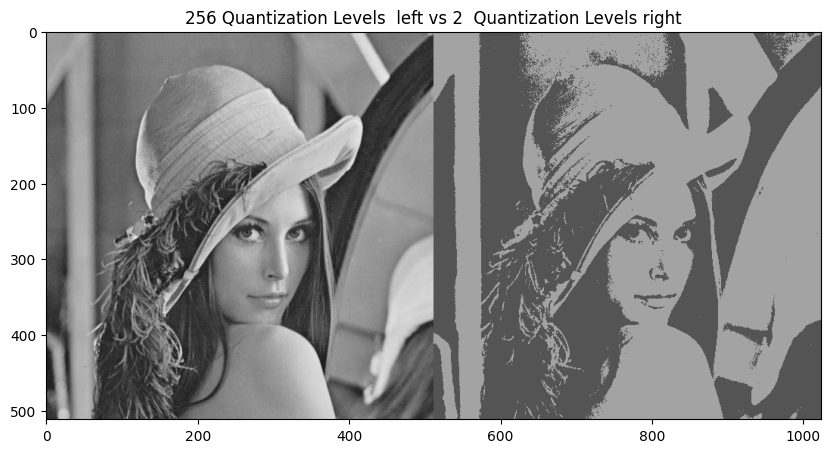

In [ ]:
#get_concat_h(image_gray,  image_gray.quantize(256//2)).show(title="Lena") 
for n in range(3,8): # Vòng lặp for để giảm số mức xám từ 32 đến 2
    plt.figure(figsize=(10,10)) # Thiết lập kích thước hiển thị ảnh 

    plt.imshow(get_concat_h(image_gray,  image_gray.quantize(256//2**n))) # Hiển thị ảnh theo hàm get_concat_h với ảnh gốc bên trái và ảnh giảm mức xám bên phải
    plt.title("256 Quantization Levels  left vs {}  Quantization Levels right".format(256//2**n)) # Tiêu đề ảnh
    plt.show() # In ảnh 

### Color Channels  


We can also work with the different color channels. Consider the following image:


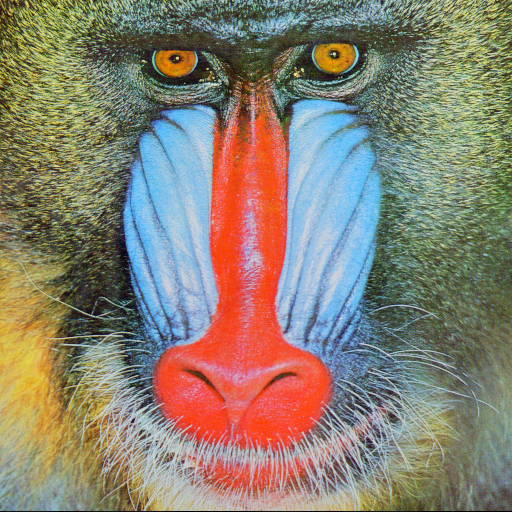

In [ ]:
baboon = Image.open('baboon.png') # Lấy ảnh baboon trên máy và gán vào biến baboon
baboon # Hiển thị ảnh baboon

We can obtain the different RGB color channels and assign them to the variables <code>red</code>, <code>green</code>, and <code>blue</code>:


In [ ]:
red, green, blue = baboon.split() # Tách các kênh màu đỏ, xanh lá cây và xanh dương từ ảnh baboon

Plotting the color image next to the red channel as a grayscale, we see that regions with red have higher intensity values.


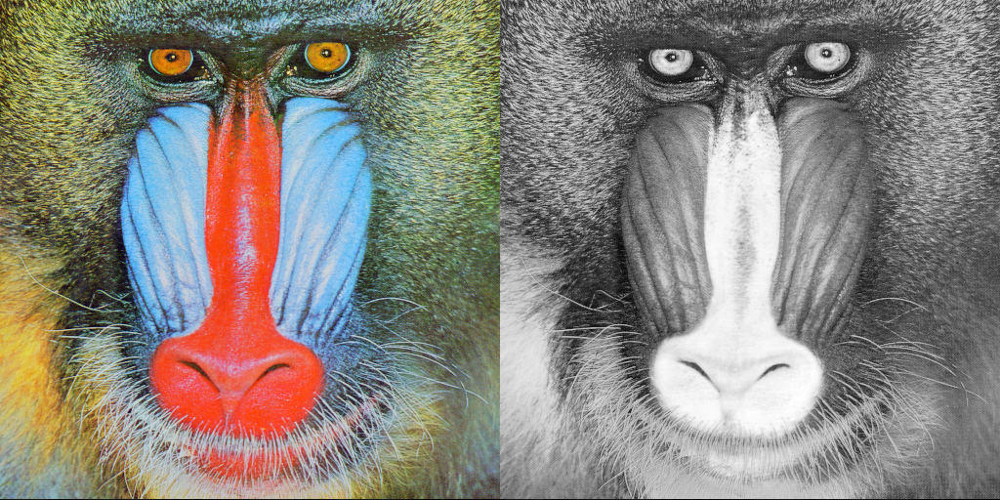

In [ ]:
get_concat_h(baboon, red) # Hiển thị ảnh baboon gốc bên trái và kênh màu đỏ bên phải

We can do the same for the blue and green channels:


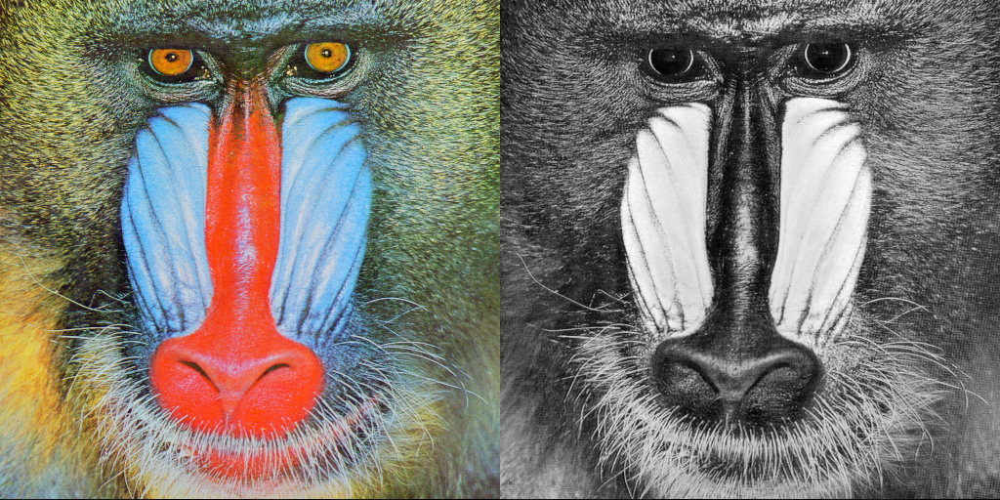

In [ ]:
get_concat_h(baboon, blue) # Hiển thị ảnh baboon gốc bên trái và kênh màu xanh dương bên phải

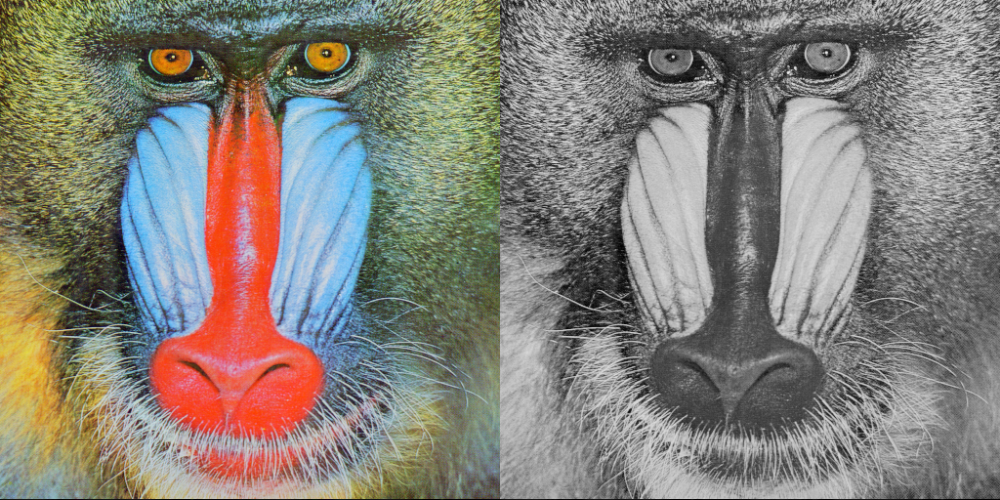

In [ ]:
get_concat_h(baboon, green) # Hiển thị ảnh baboon gốc bên trái và kênh màu xanh lá cây bên phải

## PIL Images into NumPy Arrays


NumPy is a library for Python, allowing you to work with multi-dimensional arrays and matrices. We can convert a PIL image to a NumPy array. We use <code>asarray()</code> or <code>array</code> function from NumPy to convert PIL images into NumPy arrays. 

First, let's import the numpy module:


In [ ]:
import numpy as np # Import thư viện numpy để xử lý mảng số học

We apply it to the <code>PIL</code> image we get a numpy array:


In [ ]:
array= np.asarray(image) # Chuyển đổi ảnh với phương thức np.asarray chuyển đổi ảnh thành mảng numpy
print(type(array)) # Kiểu dữ liệu của biến array

<class 'numpy.ndarray'>


`np.asarray` turns the original image into a numpy array. Often, we don't want to manipulate the image directly, but instead, create a copy of the image to manipulate. The `np.array` method creates a new copy of the image, such that the original one will remain unmodified.


In [ ]:
array = np.array(image) # Chuyển đổi ảnh với phương thức np.array để tạo bản sao ảnh mới, không ảnh hưởng đến ảnh gốc

The attribute  <code>shape</code> of a `numpy.array` object returns a tuple corresponding to the dimensions of it, the first element gives the number of rows or height of the image,  the second is element is the number of columns or width of the image. The final element is the number of colour channels.


In [ ]:
# summarize shape
print(array.shape) # In ra kích thước mảng numpy (height, width, channels)

(512, 512, 3)


or <code>(rows, columns, colors)</code>. Each element in the color axis  corresponds to the following value  <code>(R, G, B)</code> format.


We can view the intensity values by printing out the array, they range from 0 to 255 or $2^{8}$ (8-bit).


In [ ]:
print(array) # In ra giá trị mảng numpy đại diện của ảnh

[[[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 [[226 137 125]
  [226 137 125]
  [223 137 133]
  ...
  [230 148 122]
  [221 130 110]
  [200  99  90]]

 ...

 [[ 84  18  60]
  [ 84  18  60]
  [ 92  27  58]
  ...
  [173  73  84]
  [172  68  76]
  [177  62  79]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]

 [[ 82  22  57]
  [ 82  22  57]
  [ 96  32  62]
  ...
  [179  70  79]
  [181  71  81]
  [185  74  81]]]


The Intensity values are  8-bit unsigned datatype.


In [ ]:
array[0, 0] # Giá trị pixel tại vị trí (0,0) trong mảng numpy

array([226, 137, 125], dtype=uint8)

We can find the maximum and minimum intensity value of the array:      


In [ ]:
array.min() # Giá trị nhỏ nhất trong mảng numpy

np.uint8(3)

In [ ]:
array.max() # Giá trị lớn nhất trong mảng numpy

np.uint8(255)

### Indexing  


You can plot the array as an image:


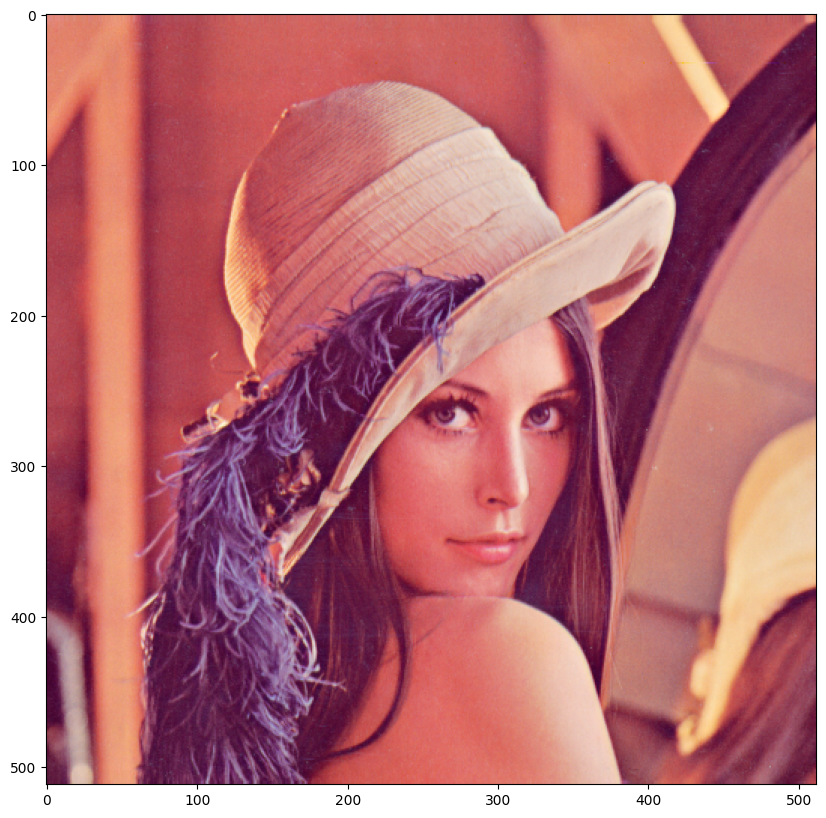

In [ ]:
plt.figure(figsize=(10,10)) # Hiển thị mảng NumPy dưới dạng hình ảnh bằng matplotlib
plt.imshow(array) # imshow(array) diễn giải mảng như một hình ảnh và hiển thị nó
plt.show()

We can use numpy slicing, for example, we can return the first 256 rows corresponding to the top half of the image:


In [ ]:
rows = 256 # Số hàng mới cho ảnh thay đổi kích thước

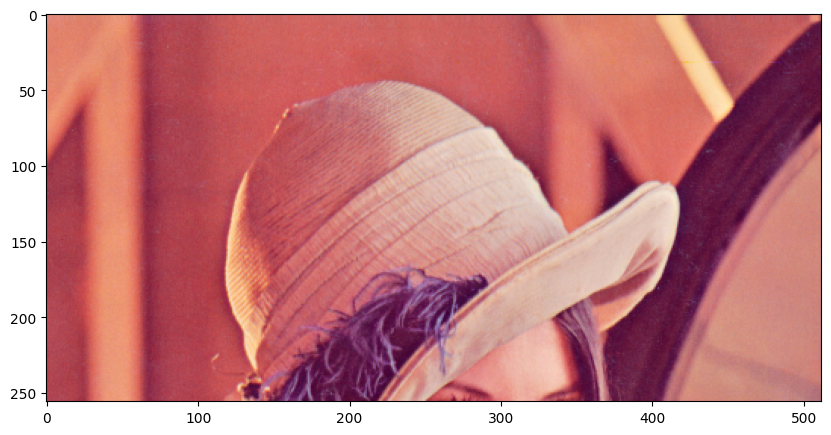

In [ ]:
plt.figure(figsize=(10,10)) # Trích xuất và chỉ hiển thị 256 hàng ảnh đầu tiên, mảng[0:hàng,:,:] cắt chiều thứ nhất (hàng) từ 0 đến 256
plt.imshow(array[0:rows,:,:])
plt.show()

We can also return the first 256 columns corresponding to the first half of the image.


In [ ]:
columns = 256 # Số cột mới cho ảnh thay đổi kích thước

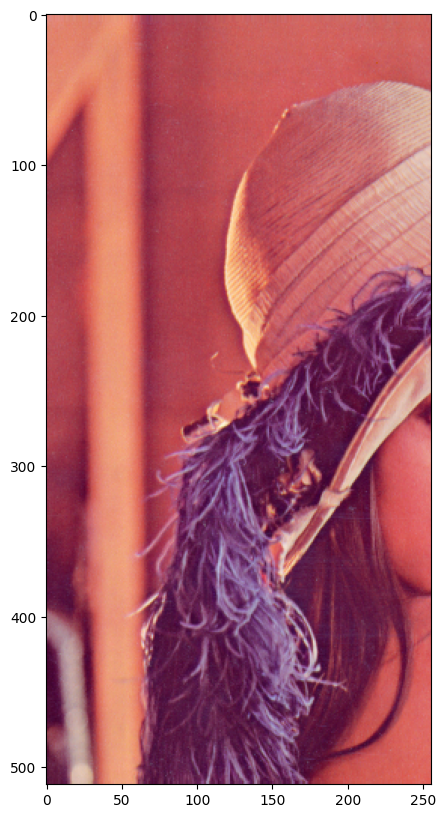

In [ ]:
plt.figure(figsize=(10,10)) # Trích xuất và chỉ hiển thị 256 cột ảnh đầu tiên, mảng[:,0:cột,:] cắt chiều thứ hai (cột) từ 0 đến 256
plt.imshow(array[:,0:columns,:])
plt.show()

If you want to reassign an array to another variable, you should use the `copy` method (we will cover this in the next section).


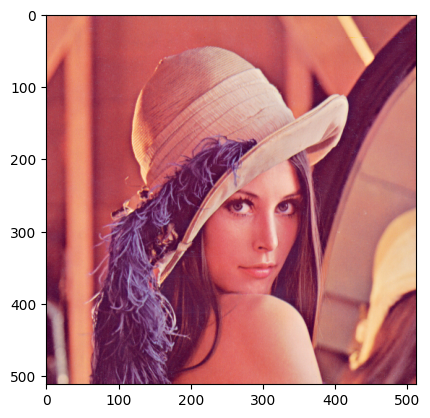

In [ ]:
A = array.copy() # Tạo bản sao độc lập của mảng để thao tác an toàn, .copy() tạo ra một vùng nhớ riêng biệt
plt.imshow(A)
plt.show()

If we do not apply the method copy(), the variable will point to the same location in memory. Consider the array B. If we set all values of array A to zero, as B points to A, the values of B will be zero too:


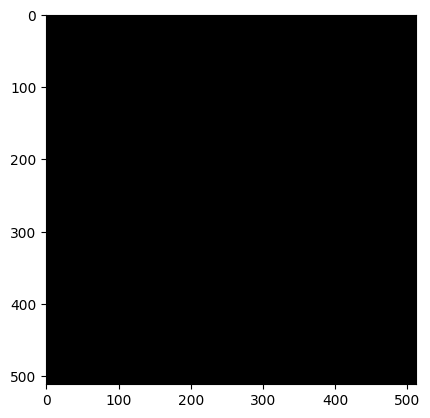

In [ ]:
B = A # Minh họa cảnh báo tham chiếu bộ nhớ bằng cách đặt giá trị mảng về 0. Không có .copy(), B tham chiếu đến vùng nhớ của A, do đó các thay đổi sẽ ảnh hưởng đến cả hai.
A[:,:,:] = 0
plt.imshow(B)
plt.show()

We can also work with the different color channels. Consider the baboon image: 


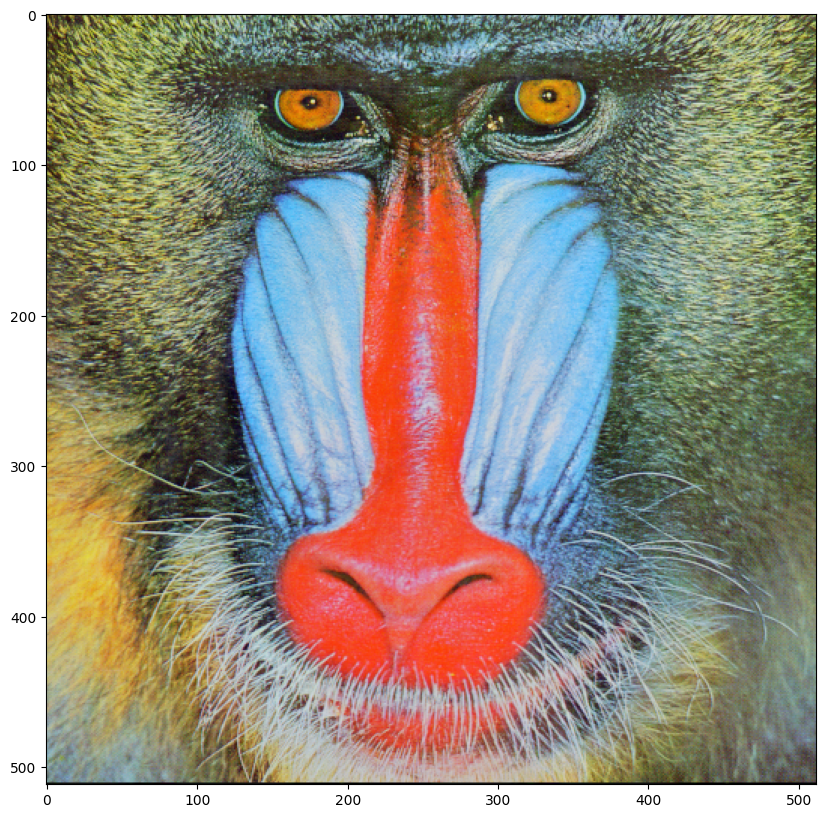

In [ ]:
baboon_array = np.array(baboon) #Chuyển đổi ảnh baboon thành mảng NumPy để xử lý kênh. Kết hợp phương thức PIL Image.open() với chuyển đổi np.array()
plt.figure(figsize=(10,10))
plt.imshow(baboon_array)
plt.show()

We can plot the red channel as intensity values of the red channel.


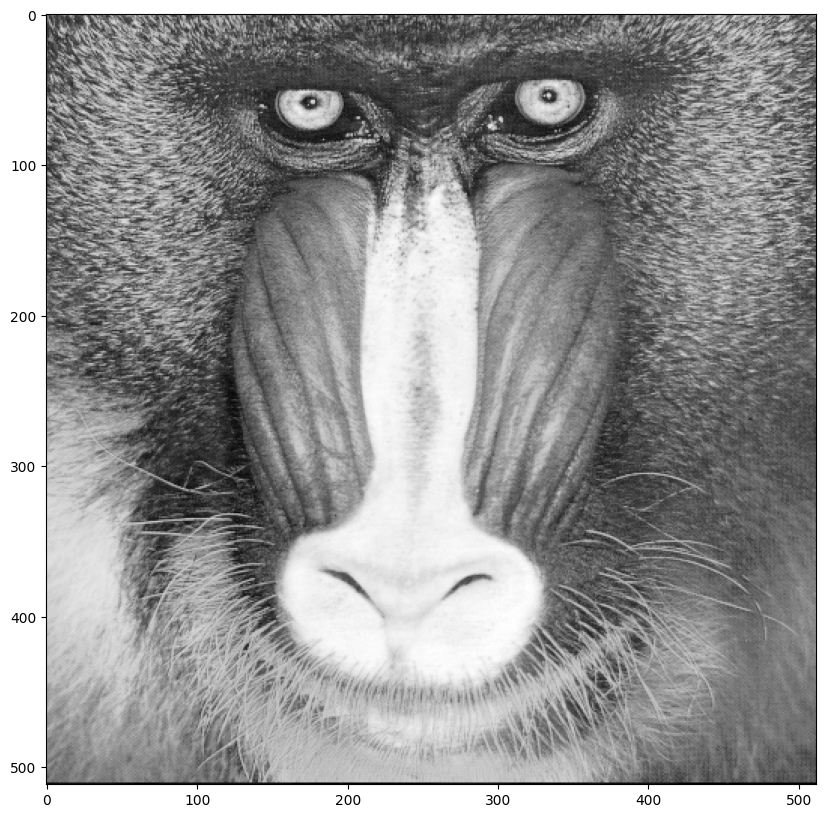

In [ ]:
baboon_array = np.array(baboon) # Chỉ hiển thị cường độ kênh màu đỏ (chỉ số 0) dưới dạng thang độ xám, mảng[:,:,0] truy cập kênh màu đỏ; cmap='gray' hiển thị dưới dạng thang độ xám
plt.figure(figsize=(10,10))
plt.imshow(baboon_array[:,:,0], cmap='gray')
plt.show()

Or we can create a new array and set all but the red color channels to zero. Therefore, when we display the image it appears red:


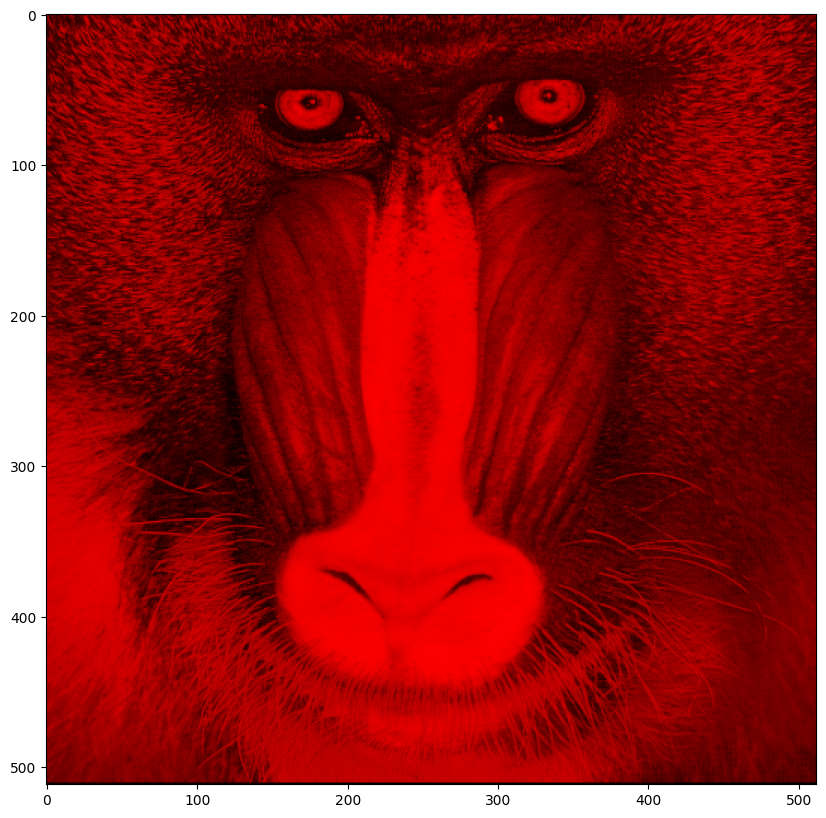

In [ ]:
baboon_red=baboon_array.copy()          # Tạo ảnh chỉ hiển thị kênh màu đỏ (loại bỏ kênh màu xanh lá và xanh dương). Đặt array[:,:,1]=0 và array[:,:,2]=0, chỉ để lại màu đỏ hiển thị.
baboon_red[:,:,1] = 0
baboon_red[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_red)
plt.show()

We can do the same for blue:


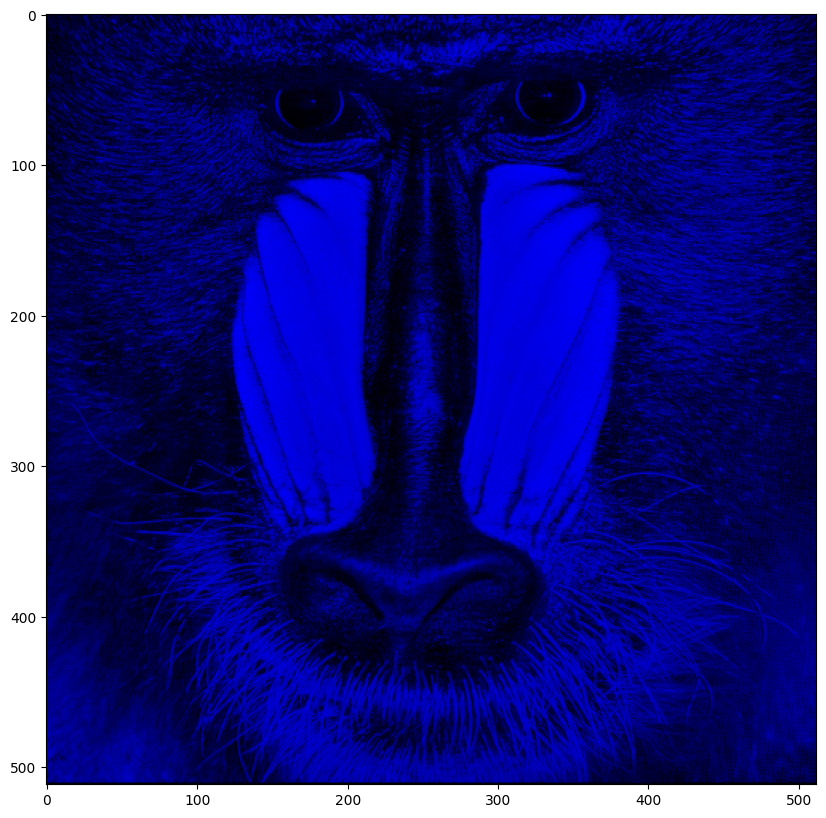

In [ ]:
baboon_blue=baboon_array.copy()         # Tạo ảnh chỉ hiển thị kênh màu xanh dương (loại bỏ kênh màu đỏ và xanh lá). Đặt array[:,:,0]=0 và array[:,:,1]=0, chỉ để lại màu xanh dương hiển thị.
baboon_blue[:,:,0] = 0
baboon_blue[:,:,1] = 0
plt.figure(figsize=(10,10))
plt.imshow(baboon_blue)
plt.show()

### Question 1: 
Use the image `lenna.png` from this lab or take any image you like.

Open the image and create a PIL Image object called `blue_lenna`, convert the image into a numpy array we can manipulate called `blue_array`, get the blue channel out of it, and finally plot the image


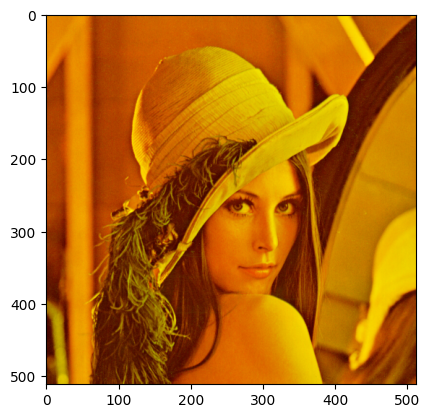

In [ ]:
# write your code here
image = Image.open('lenna.png') # Mở ảnh lenna.png và gán vào biến image
# Convert the image into a numpy array
blue_array = np.array(image) # Chuyển đổi ảnh thành mảng NumPy để xử lý kênh màu xanh dương
# Get the blue channel out of it
blue_array[:, :, 2] = 0 # Loại bỏ kênh màu xanh dương bằng cách đặt giá trị kênh này về 0

# Plot the image
plt.imshow(blue_array) # Hiển thị ảnh với kênh màu xanh dương đã bị loại bỏ
plt.show() # In ảnh

Double-click **here** for a hint.

<!-- The hint is below:

blue_array[:,:,2] = 0

-->


Double-click **here** for the solution.

<!-- The answer is below:

blue_lenna = Image.open('lenna.png')
blue_array = np.array(blue_lenna)
blue_array[:,:,2] = 0
plt.figure(figsize=(10,10))
plt.imshow(blue_array)
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).
